In [1]:
# Local setup - Colab dependencies removed
import sys
import os

# Workaround for import issues - directly import YOLO module
from ultralytics.models.yolo import YOLO
from IPython.display import display, Image
import cv2
import matplotlib.pyplot as plt

print("Imports successful!")

Imports successful!


In [2]:
import os
model_path = 'model.pt'
if not os.path.exists(model_path):
    model_path = os.path.join(os.path.dirname(__file__), 'model.pt')
model = YOLO(model_path)
print(f"Model loaded successfully from: {model_path}")

Model loaded successfully from: model.pt


In [3]:
import json
import os
import shutil

def cv2_imshow(title, image):
    """Local cv2_imshow replacement for displaying images"""
    plt.figure(figsize=(12, 8))
    if len(image.shape) == 3:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_rgb = image
    plt.imshow(image_rgb)
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [4]:
def remove_directory(directory):
    # Check if the directory exists
    if os.path.exists(directory):
        # Remove the entire directory and its contents
        shutil.rmtree(directory)


In [5]:
def detection(imgpath, confidence):
    print(f"Processing: {imgpath}")
    # Remove previous prediction
    remove_directory('runs/detect/predict')

    # Check if image exists
    if not os.path.exists(imgpath):
        print(f"Error: Image file not found at {imgpath}")
        return

    # Run YOLO detection
    results = model.predict(source=imgpath, conf=confidence, save=True, save_txt=True)
    
    # Process results
    result = results[0]
    print(f"Detection complete. Boxes found: {len(result.boxes)}")
    
    # Load the image
    image = cv2.imread(imgpath)
    
    if image is None:
        print(f"Error: Could not load image from {imgpath}")
        return
    
    # Draw bounding boxes on the image
    for box in result.boxes:
        # Get box coordinates
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = float(box.conf[0])
        cls = int(box.cls[0])
        
        print(f"Detected - Class: {cls}, Confidence: {conf:.2f}")
        
        if cls == 0:  # Drowning class
            # Draw bounding box (Blue)
            cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
            
            # Calculate and draw center point
            center_x = (x1 + x2) // 2
            center_y = (y1 + y2) // 2
            cv2.circle(image, (center_x, center_y), 5, (0, 0, 255), -1)  # Red circle
            
            # Add label
            label = f'Drowning: {conf:.2f}'
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
        else:
            # Not drowning (Green)
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = f'Not Drowning: {conf:.2f}'
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
    
    # Display the image with detected objects
    cv2_imshow('Detection Result', image)


# Example detection - uncomment and update path to test
print("Detection function ready. Call detection(image_path, confidence_threshold) to run detection.")

Detection function ready. Call detection(image_path, confidence_threshold) to run detection.


Processing: C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\test\images\video_2022-12-07_23-08-17_mp4-0_jpg.rf.4d470af3d8787068ec3e3778f50fe8bc.jpg

image 1/1 C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\test\images\video_2022-12-07_23-08-17_mp4-0_jpg.rf.4d470af3d8787068ec3e3778f50fe8bc.jpg: 1024x1024 1 swimming, 477.2ms
Speed: 33.8ms preprocess, 477.2ms inference, 32.2ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 2, Confidence: 0.77


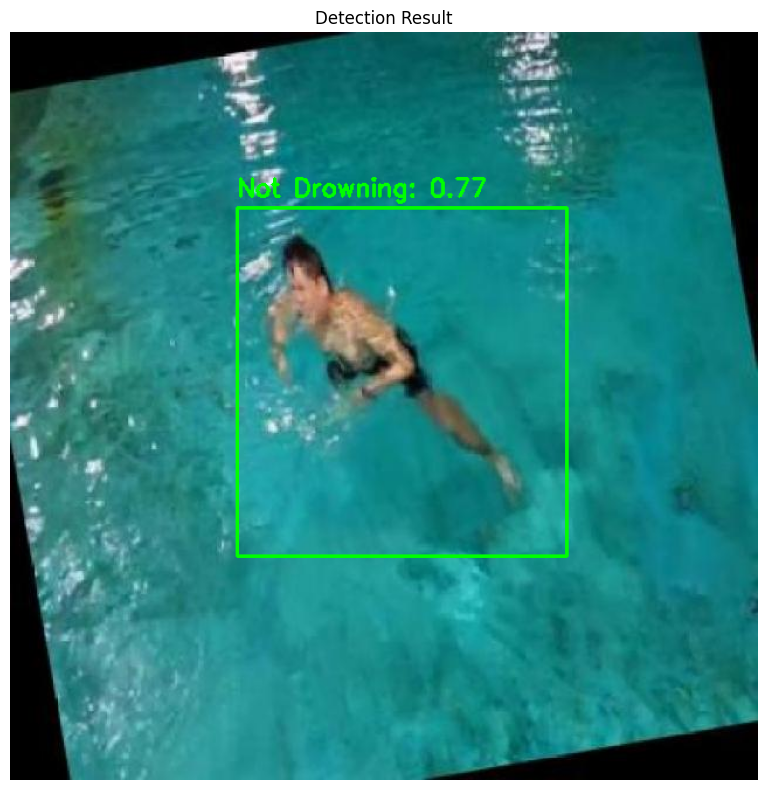

In [6]:
detection("C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Drowning Detection.v1i.yolov8\\test\\images\\video_2022-12-07_23-08-17_mp4-0_jpg.rf.4d470af3d8787068ec3e3778f50fe8bc.jpg",0.4)

Processing: C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\youtube-7_jpg.rf.406cd2b00d056b05dad8d08d65333bb7.jpg



image 1/1 C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\youtube-7_jpg.rf.406cd2b00d056b05dad8d08d65333bb7.jpg: 1024x1024 1 drowning, 511.3ms
Speed: 33.0ms preprocess, 511.3ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 0, Confidence: 0.75


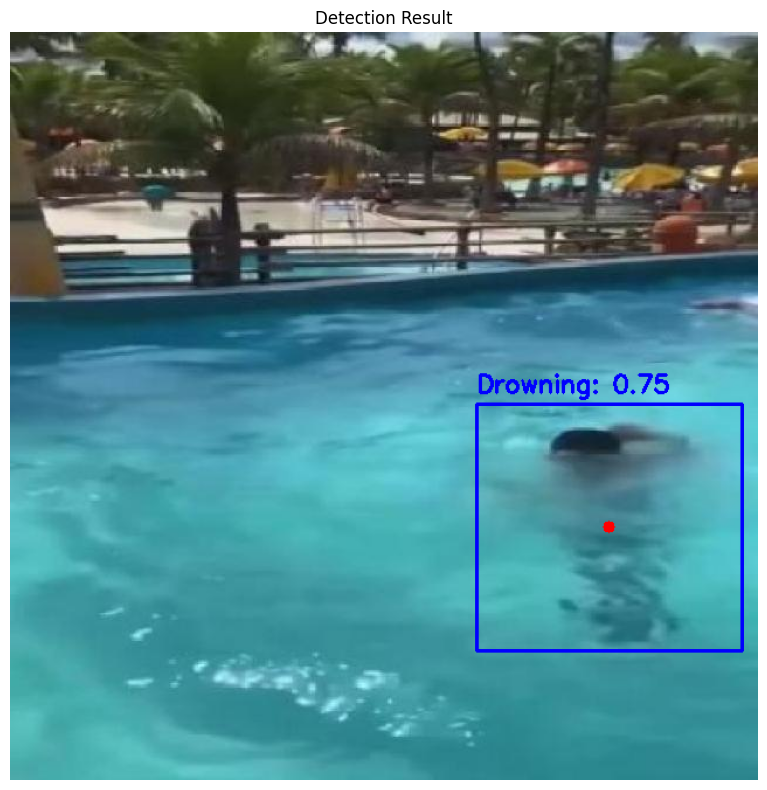

In [7]:
detection("C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Drowning Detection.v1i.yolov8\\train\\images\\youtube-7_jpg.rf.406cd2b00d056b05dad8d08d65333bb7.jpg",0.4)

Processing: C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\3-727-Drowning-Stock-Videos-and-Royalty-Free-Footage-iStock_mp4-0_jpg.rf.ed472209e67964d186256a788e2921e8.jpg

image 1/1 C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\3-727-Drowning-Stock-Videos-and-Royalty-Free-Footage-iStock_mp4-0_jpg.rf.ed472209e67964d186256a788e2921e8.jpg: 1024x1024 2 drownings, 423.0ms
Speed: 18.9ms preprocess, 423.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 2
Detected - Class: 0, Confidence: 0.75
Detected - Class: 0, Confidence: 0.60


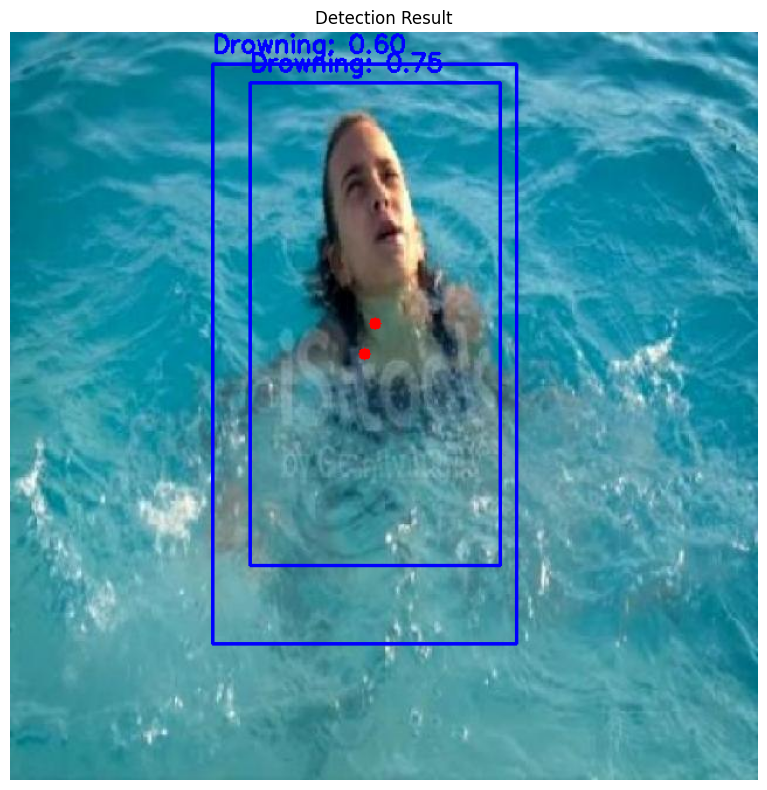

In [8]:
detection("C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Drowning Detection.v1i.yolov8\\train\\images\\3-727-Drowning-Stock-Videos-and-Royalty-Free-Footage-iStock_mp4-0_jpg.rf.ed472209e67964d186256a788e2921e8.jpg",0.4)

Processing: C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\10_MOV-8_jpg.rf.96ba1cb4e2a622860b27b0ebd633a4d1.jpg

image 1/1 C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\10_MOV-8_jpg.rf.96ba1cb4e2a622860b27b0ebd633a4d1.jpg: 1024x1024 1 drowning, 429.0ms
Speed: 23.9ms preprocess, 429.0ms inference, 2.1ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 0, Confidence: 0.67


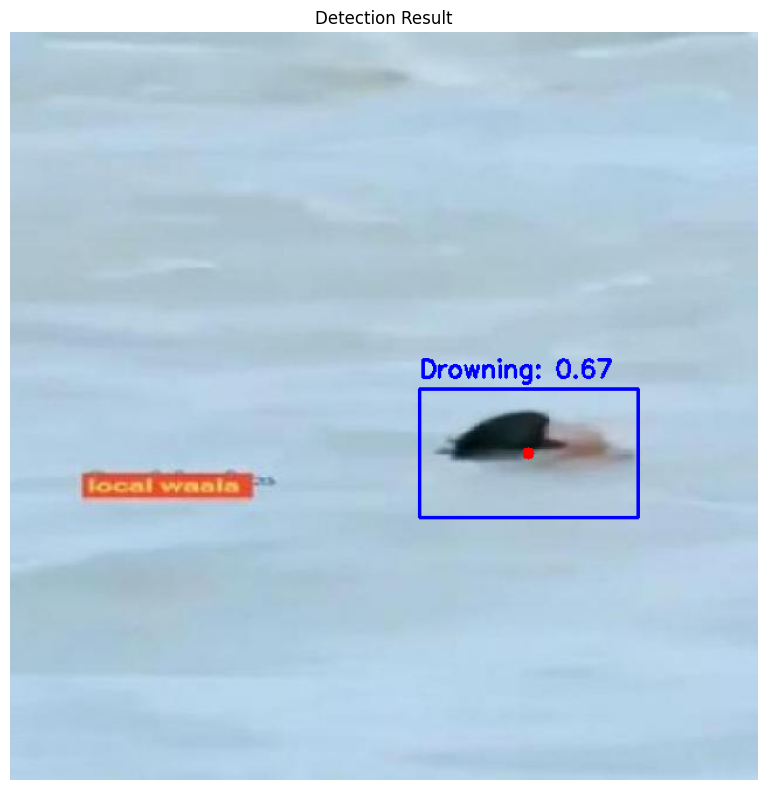

In [9]:
detection("C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Drowning Detection.v1i.yolov8\\train\\images\\10_MOV-8_jpg.rf.96ba1cb4e2a622860b27b0ebd633a4d1.jpg",0.4)

Processing: C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\-Clipchamp-_mp4-11_jpg.rf.5e37c7c5a2dc1cabd6ffdd5acf209680.jpg

image 1/1 C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Drowning Detection.v1i.yolov8\train\images\-Clipchamp-_mp4-11_jpg.rf.5e37c7c5a2dc1cabd6ffdd5acf209680.jpg: 1024x1024 3 swimmings, 487.1ms
Speed: 18.7ms preprocess, 487.1ms inference, 2.0ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 3
Detected - Class: 2, Confidence: 0.88
Detected - Class: 2, Confidence: 0.80
Detected - Class: 2, Confidence: 0.68


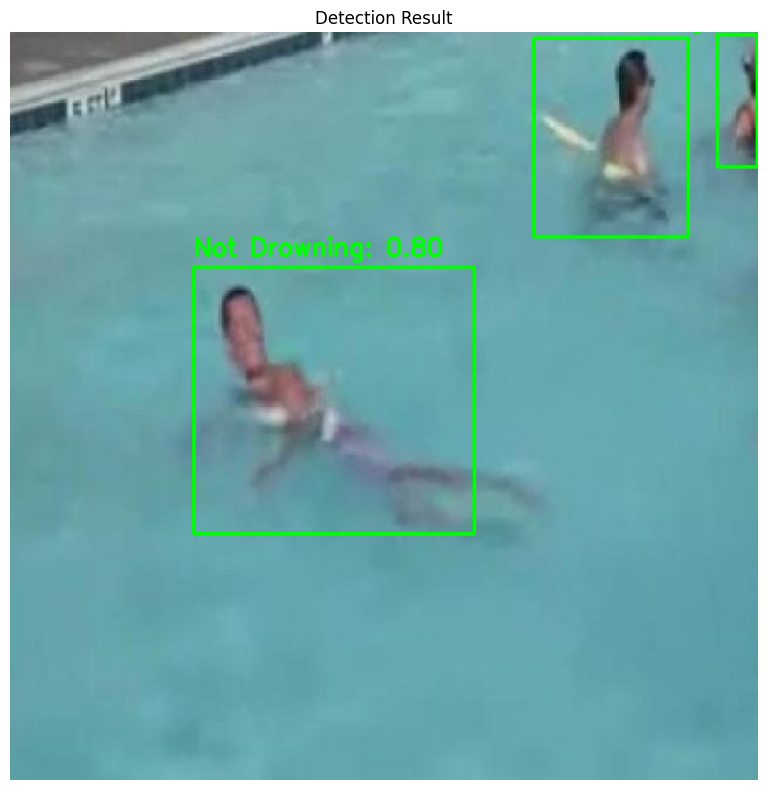

In [10]:
detection("C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Drowning Detection.v1i.yolov8\\train\\images\\-Clipchamp-_mp4-11_jpg.rf.5e37c7c5a2dc1cabd6ffdd5acf209680.jpg",0.4)

# APPLY ON VIDEO

## VIDEO PREDICTION 1

In [11]:
import cv2
import os

# Function to split a video into frames, considering every nth frame
def split_video_into_frames(video_path, output_dir, frame_interval):
    """Extract frames from video at specified interval"""
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    vidcap = cv2.VideoCapture(video_path)
    if not vidcap.isOpened():
        print(f"Error: Could not open video file {video_path}")
        return False
    
    success, image = vidcap.read()
    count = 0
    frames_saved = 0

    while success:
        if count % frame_interval == 0:  # Capture every nth frame
            frame_path = os.path.join(output_dir, f"frame_{count:04d}.jpg")
            cv2.imwrite(frame_path, image)  # Save frame as JPEG file
            frames_saved += 1
        success, image = vidcap.read()
        count += 1
    
    vidcap.release()
    print(f"Extracted {frames_saved} frames from {video_path}")
    return True


# Function for object detection on video frames
def detection_on_video_frames(frames_dir, confidence):
    """Run detection on all frames in directory"""
    if not os.path.exists(frames_dir):
        print(f"Frames directory not found: {frames_dir}")
        return
    
    frame_files = sorted([f for f in os.listdir(frames_dir) if f.endswith(".jpg")])
    print(f"Processing {len(frame_files)} frames...")
    
    for i, filename in enumerate(frame_files[:5]):  # Process first 5 frames as demo
        frame_path = os.path.join(frames_dir, filename)
        print(f"\nFrame {i+1}/5: {filename}")
        # Perform object detection on each frame
        detection(frame_path, confidence)


print("Video processing functions loaded successfully!")

Video processing functions loaded successfully!


## VIDEO PREDICTION 2

Extracted 127 frames from C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Videos\test.mp4
Processing 127 frames...

Frame 1/5: frame_0000.jpg
Processing: /content/frames/frame_0000.jpg

image 1/1 c:\content\frames\frame_0000.jpg: 576x1024 1 swimming, 223.4ms
Speed: 8.0ms preprocess, 223.4ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 2, Confidence: 0.45


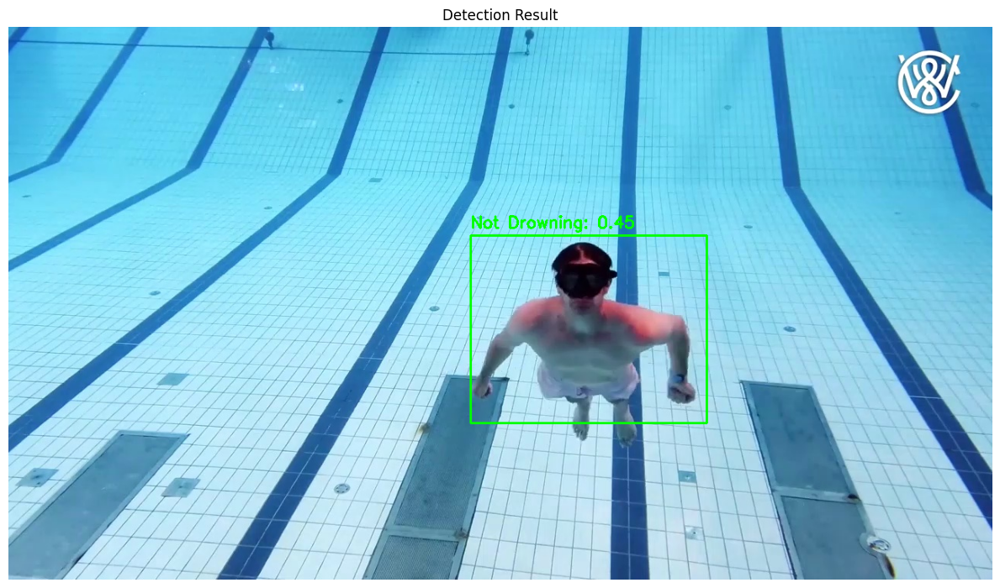


Frame 2/5: frame_0020.jpg
Processing: /content/frames/frame_0020.jpg

image 1/1 c:\content\frames\frame_0020.jpg: 576x1024 1 swimming, 269.6ms
Speed: 9.5ms preprocess, 269.6ms inference, 1.8ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 2, Confidence: 0.52


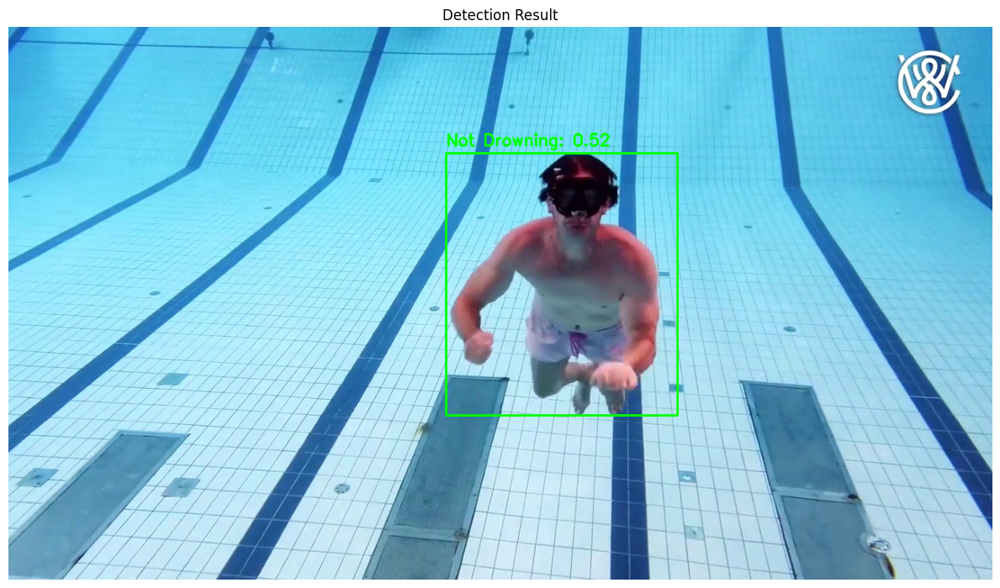


Frame 3/5: frame_0040.jpg
Processing: /content/frames/frame_0040.jpg

image 1/1 c:\content\frames\frame_0040.jpg: 576x1024 (no detections), 352.4ms
Speed: 11.6ms preprocess, 352.4ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
0 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 0


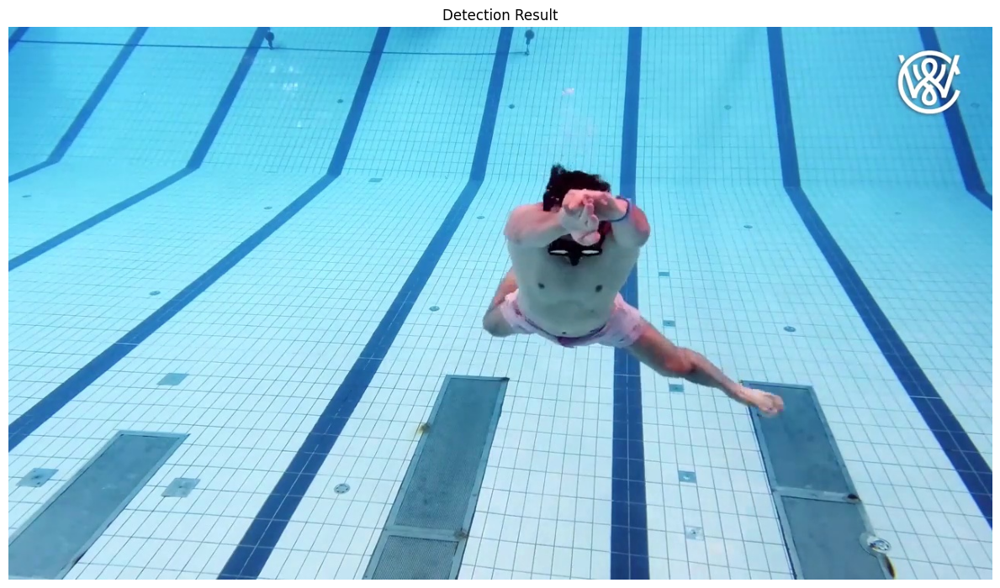


Frame 4/5: frame_0060.jpg
Processing: /content/frames/frame_0060.jpg

image 1/1 c:\content\frames\frame_0060.jpg: 576x1024 1 out of water, 309.5ms
Speed: 13.8ms preprocess, 309.5ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 1, Confidence: 0.64


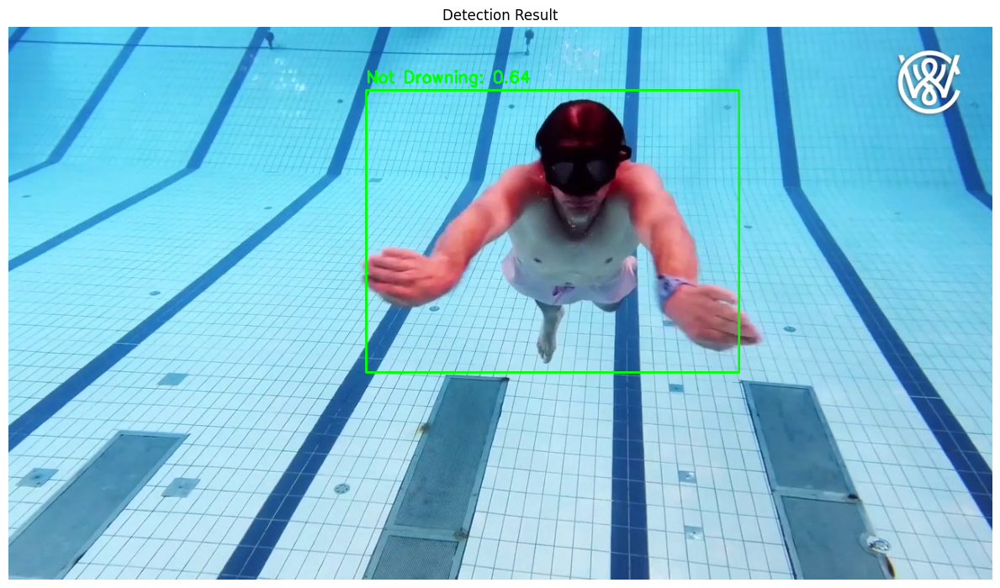


Frame 5/5: frame_0080.jpg
Processing: /content/frames/frame_0080.jpg

image 1/1 c:\content\frames\frame_0080.jpg: 576x1024 1 out of water, 203.4ms
Speed: 12.3ms preprocess, 203.4ms inference, 1.8ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 1, Confidence: 0.73


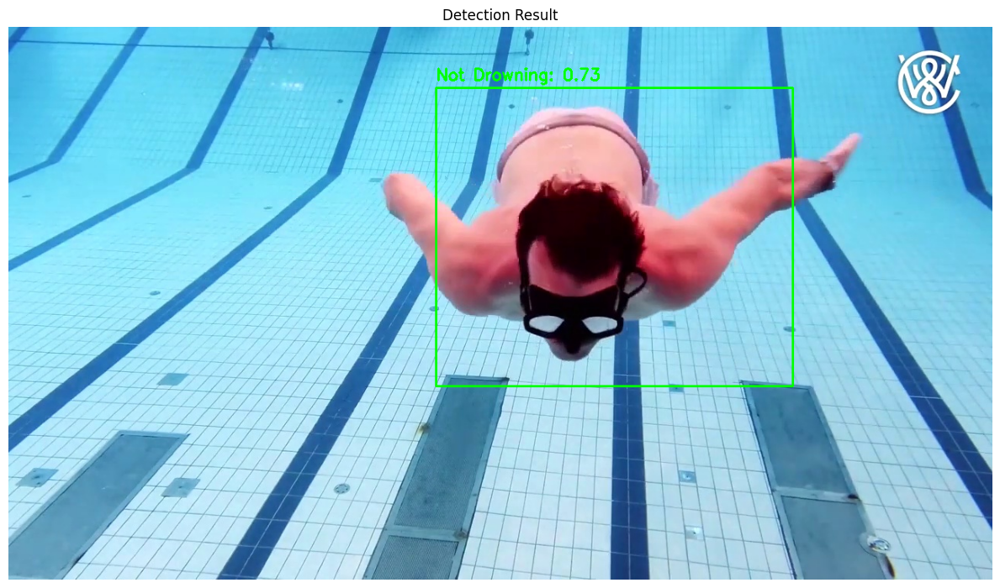

In [12]:
# Path to your video file
video_path = "C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Videos\\test.mp4"

frames_directory = '/content/frames/'

confidence_threshold = 0.4
remove_directory('/content/frames')

split_video_into_frames(video_path, frames_directory,20)

detection_on_video_frames(frames_directory, confidence_threshold)

***THE CLEARER THE VIDEO THE MORE ACCURATE DETECTION WILL BE***

Extracted 44 frames from C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Videos\drowning__006_1.mp4
Processing 44 frames...

Frame 1/5: frame_0000.jpg
Processing: /content/frames/frame_0000.jpg

image 1/1 c:\content\frames\frame_0000.jpg: 576x1024 1 drowning, 217.9ms
Speed: 9.8ms preprocess, 217.9ms inference, 1.8ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
1 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 1
Detected - Class: 0, Confidence: 0.45


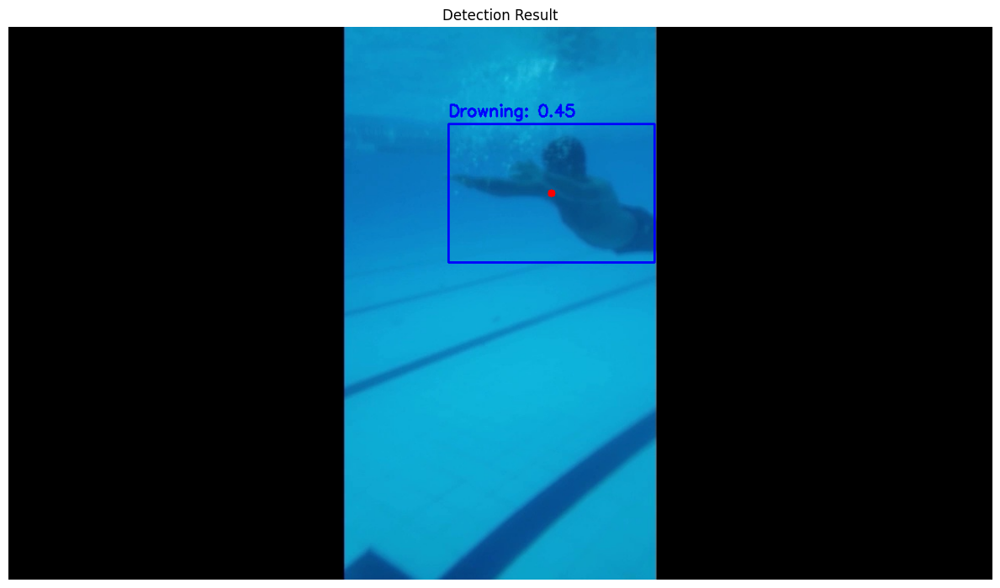


Frame 2/5: frame_0020.jpg
Processing: /content/frames/frame_0020.jpg

image 1/1 c:\content\frames\frame_0020.jpg: 576x1024 (no detections), 242.8ms
Speed: 10.6ms preprocess, 242.8ms inference, 3.0ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
0 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 0


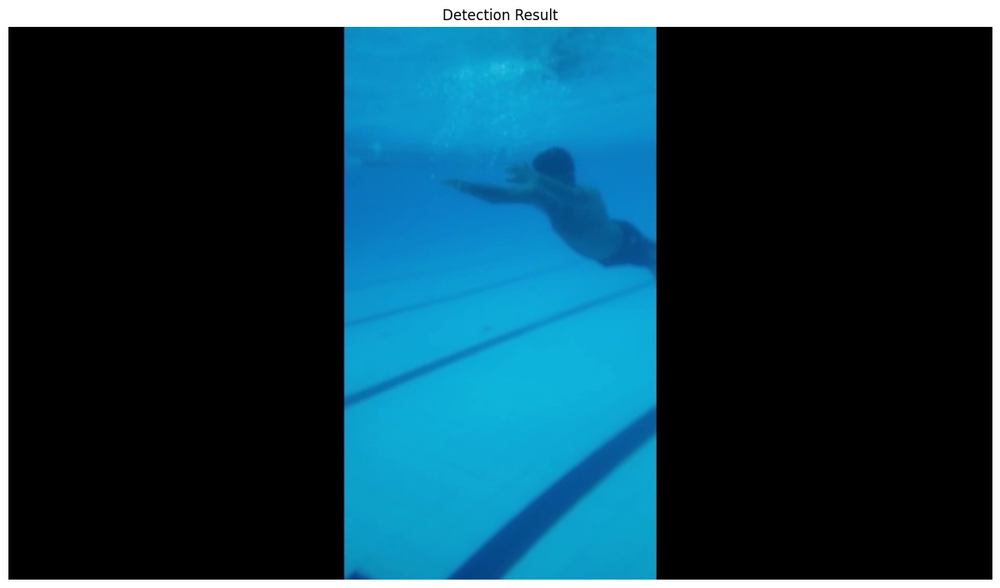


Frame 3/5: frame_0040.jpg
Processing: /content/frames/frame_0040.jpg

image 1/1 c:\content\frames\frame_0040.jpg: 576x1024 (no detections), 202.2ms
Speed: 10.1ms preprocess, 202.2ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
0 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 0


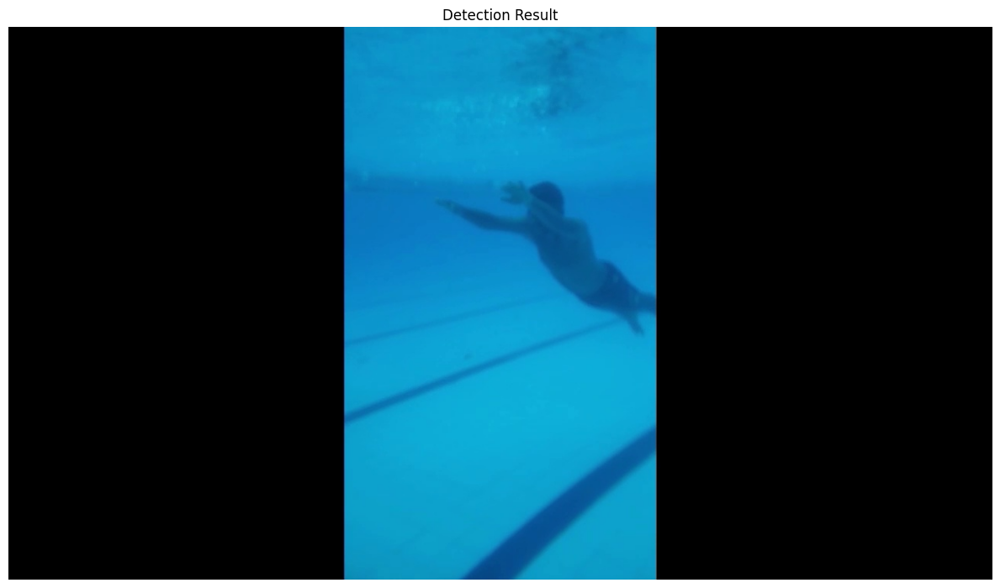


Frame 4/5: frame_0060.jpg
Processing: /content/frames/frame_0060.jpg

image 1/1 c:\content\frames\frame_0060.jpg: 576x1024 (no detections), 184.3ms
Speed: 13.3ms preprocess, 184.3ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
0 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 0


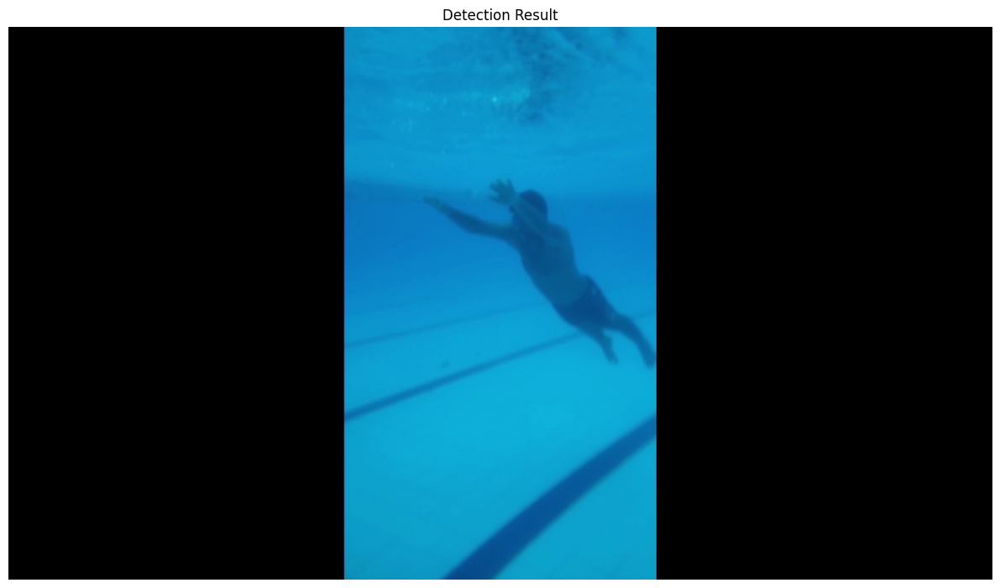


Frame 5/5: frame_0080.jpg
Processing: /content/frames/frame_0080.jpg

image 1/1 c:\content\frames\frame_0080.jpg: 576x1024 (no detections), 170.0ms
Speed: 8.9ms preprocess, 170.0ms inference, 1.2ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict
0 label saved to C:\Users\HP\Downloads\Automated-Drowning-Detection-YOLOV8-main\Automated-Drowning-Detection-YOLOV8-main\runs\detect\predict\labels
Detection complete. Boxes found: 0


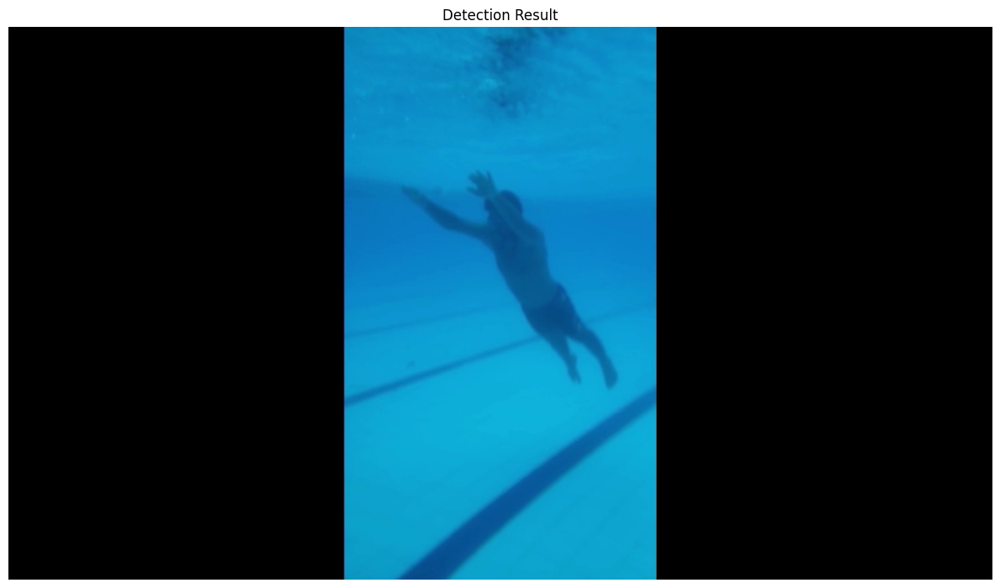

In [ ]:
# Path to your video file
video_path ="C:\\Users\\HP\\Downloads\\Automated-Drowning-Detection-YOLOV8-main\\Videos\\drowning__006_1.mp4"

frames_directory = '/content/frames/'

confidence_threshold = 0.4
remove_directory('/content/frames')

split_video_into_frames(video_path, frames_directory,20)

detection_on_video_frames(frames_directory, confidence_threshold)